# Use a CNN to recognize sounds

This notebook contains all the code you need to use an existing (pre-trained) OpenSoundscape convolutional neural network model (CNN) to make predictions on your own data - for instance, to detect the song or call of an animal the CNN has been trained to recognize. It asssumes that you already have access to a CNN that has been trained to recognize the sound of interest. 

To find publicly available pre-trained CNNs, check out the [Bioacoustics Model Zoo](https://github.com/kitzeslab/bioacoustics-model-zoo/tree/main). 

If you are interested in training your own CNN, see the other tutorials at [opensoundscape.org](https://opensoundscape.org) related to model training. 

Before running this tutorial, install OpenSoundscape by following the instructions on the OpenSoundscape website, [opensoundscape.org](http://opensoundscape.org/). More detailed tutorials about data preprocessing, training CNNs, and customizing prediction methods can also be found on this site.


## Run this tutorial

This tutorial is more than a reference! It's a Jupyter Notebook which you can run and modify on Google Colab or your own computer.

|Link to tutorial|How to run tutorial|
| :- | :- |
| [![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/kitzeslab/opensoundscape/blob/master/docs/tutorials/predict_with_cnn.ipynb) | The link opens the tutorial in Google Colab. Uncomment the "installation" line in the first cell to install OpenSoundscape. |
| [![Download via DownGit](https://img.shields.io/badge/GitHub-Download-teal?logo=github)](https://minhaskamal.github.io/DownGit/#/home?url=https://github.com/kitzeslab/opensoundscape/blob/master/docs/tutorials/predict_with_cnn.ipynb) | The link downloads the tutorial file to your computer. Follow the [Jupyter installation instructions](https://opensoundscape.org/en/latest/installation/jupyter.html), then open the tutorial file in Jupyter. |

In [1]:
# if this is a Google Colab notebook, install opensoundscape in the runtime environment
if 'google.colab' in str(get_ipython()):
  %pip install git+https://github.com/kitzeslab/opensoundscape@develop ipykernel==5.5.6 ipython==7.34.0 pillow==9.4.0

### package imports

The `cnn` module provides a function `load_model` to load saved opensoundscape models

In [2]:
from opensoundscape.ml.cnn import load_model
from opensoundscape import Audio
import opensoundscape

load some additional packages and perform some setup for the Jupyter notebook.

In [3]:
# Other utilities and packages
import torch
from pathlib import Path
import numpy as np
import pandas as pd
from glob import glob
import subprocess

In [4]:
#set up plotting
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize']=[15,5] #for large visuals
%config InlineBackend.figure_format = 'retina'

### Load a model

Models can be loaded either from a local file (`load_model(file_path)`) or directly from the [Bioacoustics Model Zoo](https://github.com/kitzeslab/bioacoustics-model-zoo/tree/main) like this:

> Note: make sure to install the bioacoustics_model_zoo as a package in your python environment:

`pip install git+https://github.com/kitzeslab/bioacoustics-model-zoo`

After installing, a running notebook must be restarted to gain access to the package

In [ ]:
import bioacoustics_model_zoo as bmz

# list available models from the model zoo
bmz.utils.list_models()

Using cache found in /Users/SML161/.cache/torch/hub/kitzeslab_bioacoustics-model-zoo_0.11.0.dev1


['BirdNET',
 'HawkEars',
 'MissingHawkearsDependency',
 'MissingTFDependency',
 'Perch',
 'SeparationModel',
 'YAMNet',
 'rana_sierrae_cnn']

Some models require additional dependencies. HawkEars requires the `timm` and `torchaudio` packages to be installed in your environment.

In [ ]:
hawkears = bmz.HawkEars()

Using cache found in /Users/SML161/.cache/torch/hub/kitzeslab_bioacoustics-model-zoo_0.11.0.dev1


File hgnet1.ckpt already exists; skipping download.
Loading model from local checkpoint /Users/SML161/opensoundscape/docs/tutorials/hgnet1.ckpt...
File hgnet2.ckpt already exists; skipping download.
Loading model from local checkpoint /Users/SML161/opensoundscape/docs/tutorials/hgnet2.ckpt...
File hgnet3.ckpt already exists; skipping download.
Loading model from local checkpoint /Users/SML161/opensoundscape/docs/tutorials/hgnet3.ckpt...
File hgnet4.ckpt already exists; skipping download.
Loading model from local checkpoint /Users/SML161/opensoundscape/docs/tutorials/hgnet4.ckpt...
File hgnet5.ckpt already exists; skipping download.
Loading model from local checkpoint /Users/SML161/opensoundscape/docs/tutorials/hgnet5.ckpt...


/Users/SML161/opensoundscape/opensoundscape/ml/cnn.py:621: UserWarning: 
                    This architecture is not listed in opensoundscape.ml.cnn_architectures.ARCH_DICT.
                    It will not be available for loading after saving the model with .save() (unless using pickle=True). 
                    To make it re-loadable, define a function that generates the architecture from arguments: (n_classes, n_channels) 
                    then use opensoundscape.ml.cnn_architectures.register_architecture() to register the generating function.

                    The function can also set the returned object's .constructor_name to the registered string key in ARCH_DICT
                    to avoid this warning and ensure it is reloaded correctly by opensoundscape.ml.load_model().

                    See opensoundscape.ml.cnn_architectures module for examples of constructor functions
                    
  warnings.warn(
/Users/SML161/opensoundscape/opensoundscape/ml/cnn.py:64

#### Save model to file
If you wish to save the model to a local file, simply use `.save()`:

In [ ]:
model = bmz.RanaSierraeCNN()
model.save("rana_sierrae_cnn.model")

Using cache found in /Users/SML161/.cache/torch/hub/kitzeslab_bioacoustics-model-zoo_0.11.0.dev1


#### Load a CNN from a local file
loading a CNN from a local file using the `opensoundscape.cnn.load_model` function:

In [ ]:
model = load_model("./rana_sierrae_cnn.model")

/Users/SML161/opensoundscape/opensoundscape/preprocess/overlay.py:98: UserWarning: Overlay class's .overlay_df will be None after loading from dict and `.criterion_fn` will be always_true(). Reset these attributes and set .bypass to False to use Overlay after loading with from_dict().
  warnings.warn(


note: for model zoo models such as Perch, BirdNEt, and SeparationModel, instead use the syntax `Perch.load(model_path)` to load the model from a saved file. 

### Choose audio files for prediction

Create a list of audio files to predict on. They can be of any length. Consider using `glob` to find many files at once.

For this example, let's download a 1-minute audio clip:

In [ ]:
url = "https://tinyurl.com/birds60s"
Audio.from_url(url).save("./1min.wav")

use glob to create a list of all files matching a pattern in a folder:

In [ ]:
from glob import glob

audio_files = glob("./*.wav")  # match all .wav files in the current directory
audio_files

['./1min.wav']

Listening to the recording, we can hear songs and calls of Wood Thrush, Ovenbird, Black-and-white Warblers, Hooded Warblers, and more. 

In [11]:
Audio.from_file(audio_files[0])

<Audio(samples=(1920000,), sample_rate=32000)>

## generate predictions with the model
The model returns a dataframe with a MultiIndex of file, start_time, and end_time. There is one column for each class. 

The values returned by the model range from -infinity to infinity (theoretically), and higher scores mean the model is more confident the class (song/species/sound type) is present in the audio clip.

In [12]:
scores = hawkears.predict(audio_files)
scores.head()

  0%|          | 0/20 [00:00<?, ?it/s]

American Bullfrog  American Toad  \
file       start_time end_time                                     
./1min.wav 0.0        3.0               -7.189046      -7.240285   
           3.0        6.0               -7.725979      -7.325639   
           6.0        9.0               -7.533139      -7.400362   
           9.0        12.0              -7.599768      -7.578323   
           12.0       15.0              -7.584840      -7.605757   

                                Boreal Chorus Frog    Canine  Canadian Toad  \
file       start_time end_time                                                
./1min.wav 0.0        3.0                -7.408662 -6.765031      -7.293872   
           3.0        6.0                -7.442556 -7.198036      -7.397572   
           6.0        9.0                -7.404266 -7.763229      -7.522434   
           9.0        12.0               -7.766273 -7.555594      -7.488980   
           12.0       15.0               -7.373958 -7.537561      -7.546284   

                                Gray Treefrog  Great Plains Toad  Green Frog  \
file       start_time end_time                                                 
./1min.wav 0.0        3.0           -6.992054          -7.558580   -7.284412   
           3.0        6.0           -7.553974          -7.765445   -7.294110   
           6.0        9.0           -7.552319          -7.549842   -7.291197   
           9.0        12.0          -7.718054          -7.919894   -6.824801   
           12.0       15.0          -7.816696          -7.939711   -7.335641   

                                Leopard Frog    Mashup  ...  Yellow Rail  \
file       start_time end_time                          ...                
./1min.wav 0.0        3.0          -7.212590 -6.917059  ...    -7.253715   
           3.0        6.0          -7.590232 -7.164769  ...    -7.232981   
           6.0        9.0          -7.755048 -8.007491  ...    -7.548021   
           9.0        12.0         -7.935552 -7.294801  ...    -7.942136   
           12.0       15.0         -7.677889 -7.681835  ...    -7.378137   

                                Yellow Warbler  Yellow-bellied Flycatcher  \
file       start_time end_time                                              
./1min.wav 0.0        3.0            -6.766008                  -7.068237   
           3.0        6.0            -6.890700                  -7.505683   
           6.0        9.0            -8.092056                  -8.291543   
           9.0        12.0           -6.532678                  -7.171899   
           12.0       15.0           -7.354166                  -7.151442   

                                Yellow-bellied Sapsucker  \
file       start_time end_time                             
./1min.wav 0.0        3.0                      -7.367529   
           3.0        6.0                      -7.949086   
           6.0        9.0                      -7.739185   
           9.0        12.0                     -7.953568   
           12.0       15.0                     -8.049700   

                                Yellow-billed Cuckoo  Yellow-breasted Chat  \
file       start_time end_time                                               
./1min.wav 0.0        3.0                  -7.150388             -7.410404   
           3.0        6.0                  -7.758686             -7.540327   
           6.0        9.0                  -7.185783             -8.337725   
           9.0        12.0                 -7.146246             -7.186995   
           12.0       15.0                 -7.743028             -7.387306   

                                Yellow-headed Blackbird  \
file       start_time end_time                            
./1min.wav 0.0        3.0                     -6.703763   
           3.0        6.0                     -7.938173   
           6.0        9.0                     -7.858235   
           9.0        12.0                    -8.198204   
           12.0       15.0                   

We might want overlapping windows for clips:

In [ ]:
scores = hawkears.predict(audio_files, clip_overlap_fraction=0.5)
scores.head()

  0%|          | 0/39 [00:00<?, ?it/s]

American Bullfrog  American Toad  \
file       start_time end_time                                     
./1min.wav 0.0        3.0               -7.189046      -7.240285   
           1.5        4.5               -7.237006      -7.203690   
           3.0        6.0               -7.725979      -7.325639   
           4.5        7.5               -7.609703      -7.374477   
           6.0        9.0               -7.533139      -7.400362   

                                Boreal Chorus Frog    Canine  Canadian Toad  \
file       start_time end_time                                                
./1min.wav 0.0        3.0                -7.408662 -6.765031      -7.293872   
           1.5        4.5                -7.045453 -6.917797      -7.337045   
           3.0        6.0                -7.442556 -7.198036      -7.397572   
           4.5        7.5                -7.552007 -7.597042      -7.464030   
           6.0        9.0                -7.404266 -7.763229      -7.522434   

                                Gray Treefrog  Great Plains Toad  Green Frog  \
file       start_time end_time                                                 
./1min.wav 0.0        3.0           -6.992054          -7.558580   -7.284412   
           1.5        4.5           -7.181453          -7.173830   -7.370400   
           3.0        6.0           -7.553974          -7.765445   -7.294110   
           4.5        7.5           -7.648675          -7.610594   -7.360088   
           6.0        9.0           -7.552319          -7.549842   -7.291197   

                                Leopard Frog    Mashup  ...  Yellow Rail  \
file       start_time end_time                          ...                
./1min.wav 0.0        3.0          -7.212590 -6.917059  ...    -7.253715   
           1.5        4.5          -7.264493 -7.250544  ...    -7.307487   
           3.0        6.0          -7.590232 -7.164769  ...    -7.232981   
           4.5        7.5          -7.546871 -6.795952  ...    -7.484615   
           6.0        9.0          -7.755048 -8.007491  ...    -7.548021   

                                Yellow Warbler  Yellow-bellied Flycatcher  \
file       start_time end_time                                              
./1min.wav 0.0        3.0            -6.766008                  -7.068237   
           1.5        4.5            -7.038718                  -6.933659   
           3.0        6.0            -6.890700                  -7.505683   
           4.5        7.5            -6.586646                  -8.068594   
           6.0        9.0            -8.092056                  -8.291543   

                                Yellow-bellied Sapsucker  \
file       start_time end_time                             
./1min.wav 0.0        3.0                      -7.367529   
           1.5        4.5                      -7.530724   
           3.0        6.0                      -7.949086   
           4.5        7.5                      -7.812625   
           6.0        9.0                      -7.739185   

                                Yellow-billed Cuckoo  Yellow-breasted Chat  \
file       start_time end_time                                               
./1min.wav 0.0        3.0                  -7.150388             -7.410404   
           1.5        4.5                  -7.273841             -7.520139   
           3.0        6.0                  -7.758686             -7.540327   
           4.5        7.5                  -7.672130             -7.670213   
           6.0        9.0                  -7.185783             -8.337725   

                                Yellow-headed Blackbird  \
file       start_time end_time                            
./1min.wav 0.0        3.0                     -6.703763   
           1.5        4.5                     -6.987049   
           3.0        6.0                     -7.938173   
           4.5        7.5                     -7.642900   
           6.0        9.0                    

### adding an activation function

The code above returns the raw predictions of the model without any post-processing (such as a softmax layer or a sigmoid layer). 

For details on how to post-processing prediction scores and to generate binary 0/1 predictions of class presence, see the "Basic training and prediction with CNNs" tutorial notebook. But, as a quick example here, let's add a softmax layer to make the prediction scores for both classes sum to 1. 

We can also convert our continuous scores into True/False (or 1/0) predictions for the presence of each class in each sample. Think about whether each clip should be labeled with only one class or whether each clip could contain zero, one, or multiple classes 

We can map the raw "logit" outputs from the CNN onto the range 0-1 by applying the sigmoid activation function, which is appropriate for multi-target classification

In [ ]:
scores = hawkears.predict(audio_files, activation_layer="sigmoid", overlap_fraction=0.5)
scores.head()

/Users/SML161/opensoundscape/opensoundscape/ml/dataloaders.py:93: DeprecationWarning: `overlap_fraction` argument is deprecated and will be removed in a future version. Use `clip_overlap_fraction` instead.
  warnings.warn(


  0%|          | 0/39 [00:00<?, ?it/s]

American Bullfrog  American Toad  \
file       start_time end_time                                     
./1min.wav 0.0        3.0                0.000754       0.000717   
           1.5        4.5                0.000719       0.000743   
           3.0        6.0                0.000441       0.000658   
           4.5        7.5                0.000495       0.000627   
           6.0        9.0                0.000535       0.000611   

                                Boreal Chorus Frog    Canine  Canadian Toad  \
file       start_time end_time                                                
./1min.wav 0.0        3.0                 0.000606  0.001152       0.000679   
           1.5        4.5                 0.000871  0.000989       0.000651   
           3.0        6.0                 0.000585  0.000747       0.000612   
           4.5        7.5                 0.000525  0.000502       0.000573   
           6.0        9.0                 0.000608  0.000425       0.000541   

                                Gray Treefrog  Great Plains Toad  Green Frog  \
file       start_time end_time                                                 
./1min.wav 0.0        3.0            0.000918           0.000521    0.000686   
           1.5        4.5            0.000760           0.000766    0.000629   
           3.0        6.0            0.000524           0.000424    0.000679   
           4.5        7.5            0.000476           0.000495    0.000636   
           6.0        9.0            0.000525           0.000526    0.000681   

                                Leopard Frog    Mashup  ...  Yellow Rail  \
file       start_time end_time                          ...                
./1min.wav 0.0        3.0           0.000737  0.000990  ...     0.000707   
           1.5        4.5           0.000699  0.000709  ...     0.000670   
           3.0        6.0           0.000505  0.000773  ...     0.000722   
           4.5        7.5           0.000527  0.001117  ...     0.000561   
           6.0        9.0           0.000428  0.000333  ...     0.000527   

                                Yellow Warbler  Yellow-bellied Flycatcher  \
file       start_time end_time                                              
./1min.wav 0.0        3.0             0.001151                   0.000851   
           1.5        4.5             0.000876                   0.000973   
           3.0        6.0             0.001016                   0.000550   
           4.5        7.5             0.001377                   0.000313   
           6.0        9.0             0.000306                   0.000251   

                                Yellow-bellied Sapsucker  \
file       start_time end_time                             
./1min.wav 0.0        3.0                       0.000631   
           1.5        4.5                       0.000536   
           3.0        6.0                       0.000353   
           4.5        7.5                       0.000404   
           6.0        9.0                       0.000435   

                                Yellow-billed Cuckoo  Yellow-breasted Chat  \
file       start_time end_time                                               
./1min.wav 0.0        3.0                   0.000784              0.000605   
           1.5        4.5                   0.000693              0.000542   
           3.0        6.0                   0.000427              0.000531   
           4.5        7.5                   0.000465              0.000466   
           6.0        9.0                   0.000757              0.000239   

                                Yellow-headed Blackbird  \
file       start_time end_time                            
./1min.wav 0.0        3.0                      0.001225   
           1.5        4.5                      0.000923   
           3.0        6.0                      0.000357   
           4.5        7.5                      0.000479   
           6.0        9.0                    

Now let's use the `predict_multi_target_labels(scores)` function to label the highest scoring class 1 for each sample, and other classes 0. 

In [ ]:
from opensoundscape.metrics import predict_multi_target_labels

predicted_labels = predict_multi_target_labels(scores, threshold=0.9)

# count the number of detections for each species
detection_counts = predicted_labels.sum(0)
detection_counts[detection_counts > 0]

American Redstart    1
Hooded Warbler       4
Wood Thrush          1
dtype: int64

Do you agree with the HawkEars detections? Do you hear any other species?

In [22]:
Audio.from_file(audio_files[0])

<Audio(samples=(1920000,), sample_rate=32000)>

It is sometimes helpful to look at a histogram of the scores, although we only have a handful of clips here so the histogram is sparse. 

/Users/SML161/miniconda3/envs/opso_dev/lib/python3.9/site-packages/matplotlib_inline/config.py:68: DeprecationWarning: InlineBackend._figure_format_changed is deprecated in traitlets 4.1: use @observe and @unobserve instead.
  def _figure_format_changed(self, name, old, new):


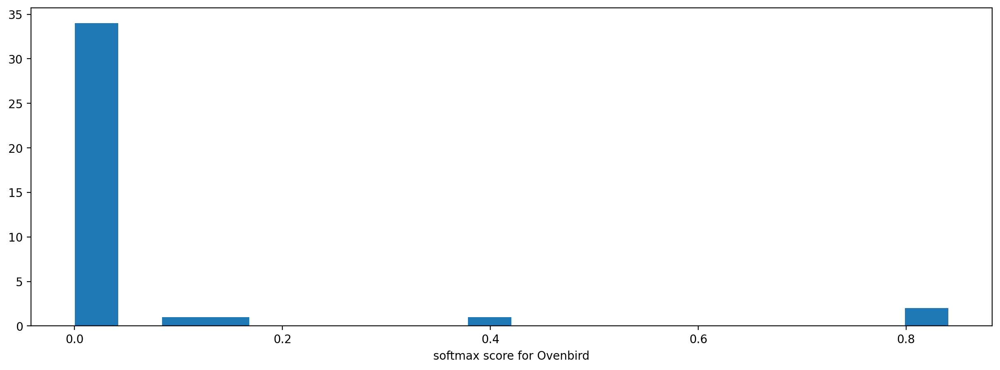

In [ ]:
_ = plt.hist(scores["Ovenbird"], bins=20)
_ = plt.xlabel("softmax score for Ovenbird")

## generate embeddings with the model
Embeddings are typically the outputs of the penultimate layer of the machine learning model. The embeddings can be useful for extracting a "feature vector" for each audio sample, with various downstream applications such as recognition of new classes or clustering based on acoustic qualities. OpenSoundscape and Biaocoustic Model Zoo classification models have a .embed() method with similar inputs and outputs to the .predict() method. Each row in the output is the embedding vector for one audio clip. 

In [17]:
embeddings = hawkears.embed(audio_files)
embeddings.head()

  0%|          | 0/20 [00:00<?, ?it/s]

0     1         2     3         4     5     \
file       start_time end_time                                               
./1min.wav 0.0        3.0        0.0   0.0  0.015307   0.0  0.012768   0.0   
           3.0        6.0        0.0   0.0  0.050027   0.0  0.091175   0.0   
           6.0        9.0        0.0   0.0  0.134351   0.0  0.000000   0.0   
           9.0        12.0       0.0   0.0  0.063012   0.0  0.068982   0.0   
           12.0       15.0       0.0   0.0  0.055098   0.0  0.081136   0.0   

                                6         7        8     9     ...      2038  \
file       start_time end_time                                 ...             
./1min.wav 0.0        3.0        0.0  0.000000  0.03281   0.0  ...  0.054830   
           3.0        6.0        0.0  0.114596  0.00000   0.0  ...  0.146361   
           6.0        9.0        0.0  0.000000  0.00000   0.0  ...  0.104546   
           9.0        12.0       0.0  0.017218  0.00000   0.0  ...  0.098295   
           12.0       15.0       0.0  0.000000  0.00000   0.0  ...  0.040954   

                                2039      2040  2041     2042  2043  2044  \
file       start_time end_time                                              
./1min.wav 0.0        3.0        0.0  0.023428   0.0  0.00000   0.0   0.0   
           3.0        6.0        0.0  0.104257   0.0  0.00000   0.0   0.0   
           6.0        9.0        0.0  0.012909   0.0  0.00000   0.0   0.0   
           9.0        12.0       0.0  0.020815   0.0  0.00000   0.0   0.0   
           12.0       15.0       0.0  0.107143   0.0  0.11212   0.0   0.0   

                                    2045  2046  2047  
file       start_time end_time                        
./1min.wav 0.0        3.0       0.000000   0.0   0.0  
           3.0        6.0       0.032779   0.0   0.0  
           6.0        9.0       0.036893   0.0   0.0  
           9.0        12.0      0.000000   0.0   0.0  
           12.0       15.0      0.037765   0.0   0.0  

[5 rows x 2048 columns]

## Inspect samples generated during prediction

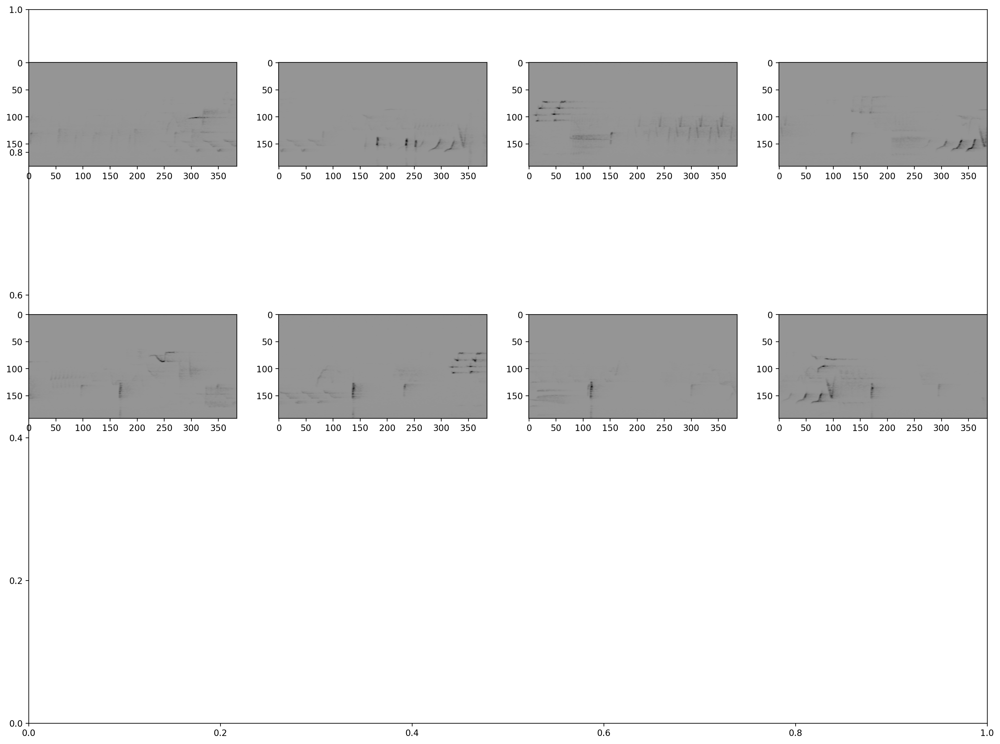

In [ ]:
from opensoundscape.preprocess.utils import show_tensor_grid
from opensoundscape.ml.datasets import AudioSplittingDataset

# generate a dataset with the samples we wish to generate and the model's preprocessor
inspection_dataset = AudioSplittingDataset(audio_files, hawkears.preprocessor)
inspection_dataset.bypass_augmentations = True

samples = [sample.data for sample in inspection_dataset.head(8)]
_ = show_tensor_grid(samples, 4)

# here we can see that hawkears produces "upside down" samples where the low frequencies are at the top of the image

## Using models trained in older OpenSoundscape versions

#### Using models from OpenSoundscape >=0.11.0

Simply load the model with `opensoundscape.ml.cnn.load_model(path)`. 

Starting with OpenSoundscape 0.11.0, the default model.save() (for CNN/SpectroramClassifier) is designed to work smoothly across package version updates: the default behavior (pickle=False) saves a state dictionary for the network parameters and a dictionary describing the preprocessing settings, as well as some other information (class list, architecture name, etc) which OpenSoundscape can use to re-create the model from the saved file so long as any custom code used to create the model/preprocessor is still available when loading the model from a file. 

#### Using models from OpenSoundscape <0.11.0

In general, if you want to use a model created in an OpenSoundscape <0.11.0 in a newer version, you should:


1. use or re-create a separate Python environment (eg, conda environment) that has the same version of OpenSoundscape used to create and train the model. 


2. Save the model's weights like this: 
```
torch.save({'weights':model.network.state_dict()},'my_weights.pt')
```


3. You'll also want to save/take note of the architecture, ordered list of model classes, and sample input shape, and all preprocessing parameters/steps (e.g. sample shape, spectrogram creation parameters, scaling/normalization).


4. Then, in your new opensoundscape environment, recreate the model with the same architecture, input shape, class list, and preprocessing parameters

5. Load the saved weights into the model architecture:

```
weights = torch.load('my_weights.pt')['weights']
my_new_model.network.load_state_dict(weights)
```

#### Changes to default preprocessing behavior across OpenSoundscape versions
Be aware of changes to default preprocessing settings between OpenSoundscape versions. In particular: 

- opensoundscape<0.7.0 used the opposite sign convention in preprocessed tensor samples: loud sounds were low values and quiet sounds were high values. Specify `model.preprocessor.pipeline.to_tensor.set(invert=True)` to match the default preprocessor behavior of opensoundscape<0.7.0

- opensoundscape<0.11.0 used skimage interpolation by default in Spectrogram.to_tensor(which is used in the SpectrogramPreprocessor.pipeline.to_tensor action), while newer version use pytorch interpolation by default (much faster). The differences in interpolation methods are subtle but lead to slightly different ML model scores. Specify `model.preprocessor.pipeline.to_tensor.set(use_skimage=True)` to match the default preprocessor behavior of opensoundscape<0.11.0. 

- opensoundscape<0.12.0 CNN class's default Overlay preprocessor had update_labels=False, >=0.12.0 has default update_labels=True

If you need assistance loading a model developed in a different OpenSoundscape version into a more recent version, please contact one of the developers of OpenSoundscape. 

### Clean up: delete model objects

In [ ]:
from pathlib import Path

for p in Path(".").glob("*.model"):
    p.unlink()

# uncomment to delete the downloaded audio file
# Path('1min.wav').unlink()